# Classify a photo as Mountain or Sea

In [1]:
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image

from keras import models
from keras import layers
from keras import optimizers

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

from keras.models import load_model

Using TensorFlow backend.


## 1. Data Preprocessing

In [3]:
#Data file locations
base_dir = 'D:\MSc2\Deep Learning Keras\Task6'
train_dir = os.path.join(base_dir, 'train')
train_dir2 = os.path.join(base_dir, 'train2')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')
train_mountain_dir = os.path.join(train_dir, 'Mountain')
train_sea_dir = os.path.join(train_dir, 'Sea')

In [ ]:
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
train_datagen2 = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
#Use generators - each photo is going to be sized to 150*150
train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        #10 photos per batch
        batch_size=10,
        #binary_crossentropy loss for binary labels
        class_mode='binary')

train_generator2 = train_datagen2.flow_from_directory(
        train_dir2,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=10,
        shuffle = False, #do not shuffle the test set
        class_mode='binary')

In [ ]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

In [ ]:
for data_batch, labels_batch in train_generator2:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

In [ ]:
for data_batch, labels_batch in validation_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

In [ ]:
for data_batch, labels_batch in test_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

## 2. Baseline Model - Densely Connected Network

In [348]:
model_base = models.Sequential() #Single Big Layer
model_base.add(layers.Flatten(input_shape=(150, 150, 3))) 
model_base.add(layers.Dense(1028, activation='relu')) 
model_base.add(layers.Dense(1, activation='sigmoid')) 
model_base.summary() #very large # of parameters

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_39 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_121 (Dense)            (None, 1028)              69391028  
_________________________________________________________________
dense_122 (Dense)            (None, 1)                 1029      
Total params: 69,392,057
Trainable params: 69,392,057
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_base.compile(loss='binary_crossentropy',
                   optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
                   metrics=['acc'])

history_base = model_base.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=20,
      validation_data=validation_generator,
      validation_steps=20) #200 training samples / 10 samples per batch = 20 steps per epoch

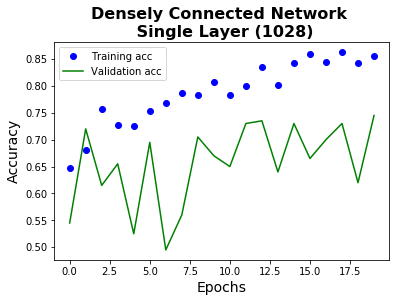

In [347]:
acc_base = history_base.history['acc']
val_acc_base = history_base.history['val_acc']
epochs_base = range(len(acc_base))

plt.plot(epochs_base, acc_base, 'bo', label='Training acc')
plt.plot(epochs_base, val_acc_base, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Densely Connected Network \n Single Layer (1028)', fontsize = 16, fontweight = 'bold')
plt.legend()

In [350]:
model0 = models.Sequential() #Two layers
model0.add(layers.Flatten(input_shape=(150, 150, 3))) 
model0.add(layers.Dense(512, activation='relu')) 
model0.add(layers.Dense(256, activation='relu'))
model0.add(layers.Dense(1, activation='sigmoid')) 
model0.summary() #34,692,097 - half # of parameters compared to big single layer

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_40 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_123 (Dense)            (None, 512)               34560512  
_________________________________________________________________
dense_124 (Dense)            (None, 256)               131328    
_________________________________________________________________
dense_125 (Dense)            (None, 1)                 257       
Total params: 34,692,097
Trainable params: 34,692,097
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model0.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

history0 = model0.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=20,
      validation_data=validation_generator,
      validation_steps=20) #200 training samples / 10 samples per batch = 20 steps per epoch

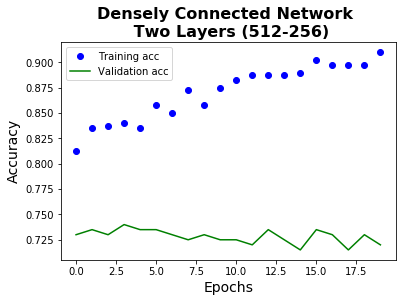

In [349]:
acc0 = history0.history['acc']
val_acc0 = history0.history['val_acc']
epochs0 = range(len(acc0))

plt.plot(epochs0, acc0, 'bo', label='Training acc')
plt.plot(epochs0, val_acc0, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Densely Connected Network \n Two Layers (512-256)', fontsize = 16, fontweight = 'bold')
plt.legend()

In [351]:
model1 = models.Sequential() #Two layer - Regularized 
model1.add(layers.Flatten(input_shape=(150, 150, 3))) 
model1.add(layers.Dense(512, activation='relu')) 
model1.add(layers.Dropout(0.1))
model1.add(layers.Dense(256, activation='relu'))
model1.add(layers.Dropout(0.1))
model1.add(layers.Dense(1, activation='sigmoid')) 
model1.summary() #34,692,097

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_41 (Flatten)         (None, 67500)             0         
_________________________________________________________________
dense_126 (Dense)            (None, 512)               34560512  
_________________________________________________________________
dropout_16 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_127 (Dense)            (None, 256)               131328    
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_128 (Dense)            (None, 1)                 257       
Total params: 34,692,097
Trainable params: 34,692,097
Non-trainable params: 0
________________________________________________________________

In [ ]:
model1.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

history1 = model1.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=20,
      validation_data=validation_generator,
      validation_steps=20) #200 training samples / 10 samples per batch = 20 steps per epoch

In [ ]:
acc1 = history1.history['acc']
val_acc1 = history1.history['val_acc']
epochs1 = range(len(acc1))

plt.plot(epochs1, acc1, 'bo', label='Training acc')
plt.plot(epochs1, val_acc1, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Densely Connected Network - \n Two Layers (Regularized)', fontsize = 16, fontweight = 'bold')
plt.legend()

In [ ]:
#Re-train model 1 using all training data
model1.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

model1.fit_generator(
      train_generator2,
      steps_per_epoch=60, #600 training samples / 10 samples per batch = 60 steps per epoch
      epochs=10) 

In [ ]:
#Test accuracy - 74%
model1.evaluate_generator(test_generator, steps=20) #200 test samples / 10 samples per batch = 20 steps

In [ ]:
#Error analysis
pred1 = model1.predict_generator(test_generator, steps=20)
pred1 = ((pred1 > 0.5) *1).reshape(200,)
true1 = test_generator.classes #Mountain = 0, Sea = 1

In [355]:
confusion_matrix(true1, pred1) #more likely to consider a picture as Mountain!

array([[79, 21],
       [31, 69]], dtype=int64)

## 3. CNN Model 

In [356]:
model2 = models.Sequential() #Add the 3 Conv Layers on top of the 2 Dense Layers

model2.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))

model2.add(layers.Flatten())
model2.add(layers.Dense(512, activation='relu'))
model2.add(layers.Dense(256, activation='relu'))
model2.add(layers.Dense(1, activation='sigmoid'))

model2.summary() #19,165,249 parameters - much less than DNN

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_65 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_65 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_66 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_67 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
flatten_42 (Flatten)         (None, 36992)             0         
__________

In [ ]:
model2.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

history2 = model2.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=20,
      validation_data=validation_generator,
      validation_steps=20) #200 training samples / 10 samples per batch = 20 steps per epoch

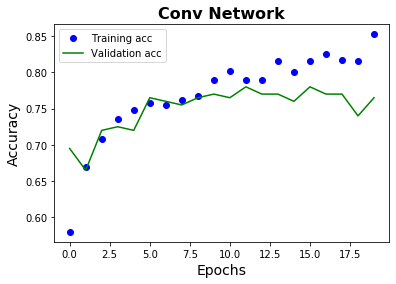

In [357]:
acc2 = history2.history['acc']
val_acc2 = history2.history['val_acc']
epochs2 = range(len(acc2))

plt.plot(epochs2, acc2, 'bo', label='Training acc')
plt.plot(epochs2, val_acc2, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network', fontsize = 16, fontweight = 'bold')
plt.legend()

In [ ]:
#Re-train model 2 using all training data
model2.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

model2.fit_generator(
      train_generator2,
      steps_per_epoch=60, #600 training samples / 10 samples per batch = 60 steps per epoch
      epochs=15) 

In [ ]:
#Test accuracy - 76%
model2.evaluate_generator(test_generator, steps=20) #200 test samples / 10 samples per batch = 20 steps

In [ ]:
#Error analysis
pred2 = model2.predict_generator(test_generator, steps=20)
pred2 = ((pred2 > 0.5) *1).reshape(200,)
true2 = test_generator.classes #Mountain = 0, Sea = 1

In [358]:
confusion_matrix(true2, pred2) #no material bias in favor of classifying any class

array([[74, 26],
       [22, 78]], dtype=int64)

## 4. CNN Model - Data Argumentation

In [ ]:
train_datagen = ImageDataGenerator( ## Note that the validation data should not be augmented!
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

train_datagen2 = ImageDataGenerator( ## Note that the validation data should not be augmented!
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

train_generator2 = train_datagen2.flow_from_directory(
        train_dir2,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=10,
        shuffle = False,
        class_mode='binary')

In [ ]:
model3 = models.Sequential()
model3.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model3.add(layers.MaxPooling2D((2, 2)))
model3.add(layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(layers.MaxPooling2D((2, 2)))
model3.add(layers.Conv2D(128, (3, 3), activation='relu'))
model3.add(layers.MaxPooling2D((2, 2)))

model3.add(layers.Flatten())
model3.add(layers.Dense(512, activation='relu'))
model3.add(layers.Dense(256, activation='relu'))
model3.add(layers.Dense(1, activation='sigmoid'))

model3.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['acc'])

In [ ]:
history3 = model3.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=200,
      validation_data=validation_generator,
      validation_steps=20) #200 training samples / 10 samples per batch = 20 steps per epoch

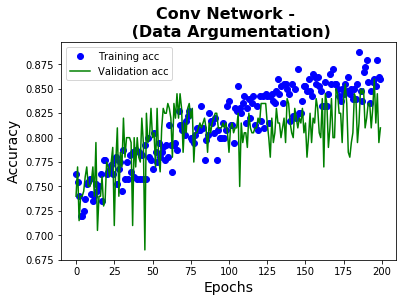

In [359]:
acc3 = history3.history['acc']
val_acc3 = history3.history['val_acc']
epochs3 = range(len(acc3))

plt.plot(epochs3, acc3, 'bo', label='Training acc')
plt.plot(epochs3, val_acc3, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network - \n (Data Argumentation)', fontsize = 16, fontweight = 'bold')
plt.legend()

In [ ]:
#Re-train model 3 using all training data
model3.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

model3.fit_generator(
      train_generator2,
      steps_per_epoch=60, #600 training samples / 10 samples per batch = 60 steps per epoch
      epochs=70) 

In [ ]:
#Test accuracy - 88%
model3.evaluate_generator(test_generator, steps=20) #200 test samples / 10 samples per batch = 20 steps

In [ ]:
#Error analysis
pred3 = model3.predict_generator(test_generator, steps=20)
pred3 = ((pred3 > 0.5) *1).reshape(200,)
true3 = test_generator.classes #Mountain = 0, Sea = 1

In [360]:
confusion_matrix(true3, pred3) #still more likely to consider a picture as Mountain!

array([[95,  5],
       [19, 81]], dtype=int64)

In [396]:
model3.save('model3.h5')

### *Try to  tune the learning rate

In [ ]:
def model_build(LR):
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu',
                            input_shape=(150, 150, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy',
                  optimizer=optimizers.RMSprop(lr=LR),
                  metrics=['acc'])
    return model

In [ ]:
learning_rates = [1e-3, 5e-4, 1e-4, 5e-5, 1e-5, 1e-6]
#learning_rates = [1e-3, 1e-4, 1e-5, 1e-6]
for lr in learning_rates:
    model = model_build(lr)
    model.fit_generator(train_generator, 
                        steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
                        epochs=100,
                        verbose = 0) 
    print("Learning rate: ", lr)
    print(model.evaluate_generator(train_generator, steps=40)) 
    print(model.evaluate_generator(validation_generator, steps=20))
    print()

## Example of Data Argumentation

In [224]:
datagen = ImageDataGenerator( 
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

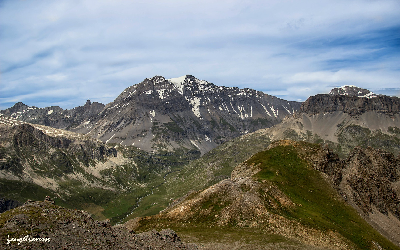

In [225]:
fnames = [os.path.join(train_mountain_dir, fname) for fname in os.listdir(train_mountain_dir)]

# We pick one image to "augment"
img_path = fnames[2]

# Read the image and resize it
img = image.load_img(img_path, target_size=(250, 400))

img

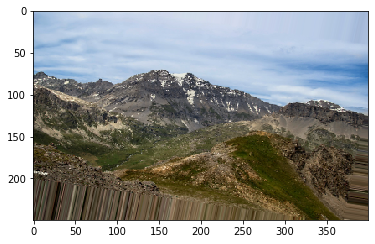

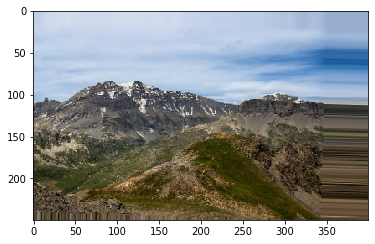

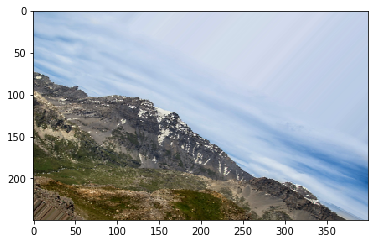

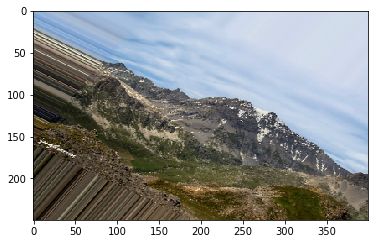

In [226]:
# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

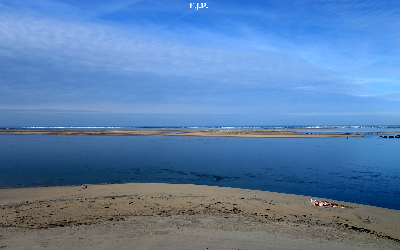

In [242]:
fnames = [os.path.join(train_sea_dir, fname) for fname in os.listdir(train_sea_dir)]

# We pick one image to "augment"
img_path = fnames[50]

# Read the image and resize it
img = image.load_img(img_path, target_size=(250, 400))

img

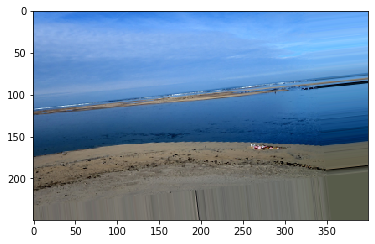

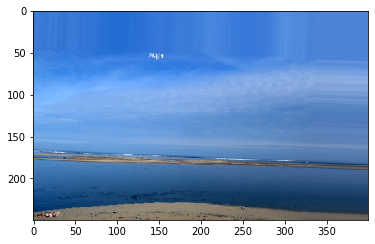

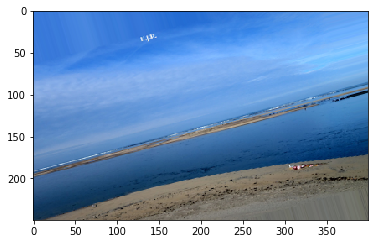

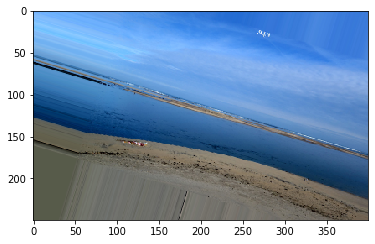

In [243]:
# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

## 5. Pre-trainined Model (1) - Feature extraction without data argumentataion

In [ ]:
from keras.applications import VGG16 #Using the VGG16 model

conv_base = VGG16(weights='imagenet',
                  include_top=False, #not including the (top classifier) densely connected classifier
                  input_shape=(150, 150, 3))

conv_base.summary()

In [ ]:
datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

In [ ]:
def extract_features(directory, sample_count):
    features = np.zeros(shape=(sample_count, 4, 4, 512)) #match the final feature map of shape (4,4,512)
    labels = np.zeros(shape=(sample_count))
    generator = datagen.flow_from_directory(
        directory,
        target_size=(150, 150),
        batch_size=batch_size,
        class_mode='binary')
    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch) #running the conv base over the dataset and record the output
                                                        #features
        features[i * batch_size : (i + 1) * batch_size] = features_batch #update the features array (with batch of features)
        labels[i * batch_size : (i + 1) * batch_size] = labels_batch #update the labels array (with batch of labels)
        i += 1
        if i * batch_size >= sample_count:
            # Note that since generators yield data indefinitely in a loop,
            # we must `break` after every image has been seen once.
            break
    return features, labels

In [ ]:
train_features, train_labels = extract_features(train_dir, 400)
validation_features, validation_labels = extract_features(validation_dir, 200)
test_features, test_labels = extract_features(test_dir, 200)

In [ ]:
train_features.shape

In [ ]:
train_labels.shape

In [ ]:
#Feed the Extracted Features into the Densely Connected Layers
#Flatten the features
train_features = np.reshape(train_features, (400, 4 * 4 * 512))
validation_features = np.reshape(validation_features, (200, 4 * 4 * 512))
test_features = np.reshape(test_features, (200, 4 * 4 * 512))

In [ ]:
train_features2 = np.concatenate((train_features, validation_features), axis = 0)

In [ ]:
train_labels2 = np.concatenate((train_labels, validation_labels), axis = 0)

In [ ]:
model4 = models.Sequential()
model4.add(layers.Dense(512, activation='relu', input_dim=4 * 4 * 512))
model4.add(layers.Dense(256, activation='relu', input_dim=4 * 4 * 512))
model4.add(layers.Dense(1, activation='sigmoid'))

model4.compile(optimizer=optimizers.RMSprop(lr=1e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

In [ ]:
history4 = model4.fit(train_features, train_labels,
                    epochs=20,
                    batch_size=20,
                    validation_data=(validation_features, validation_labels))

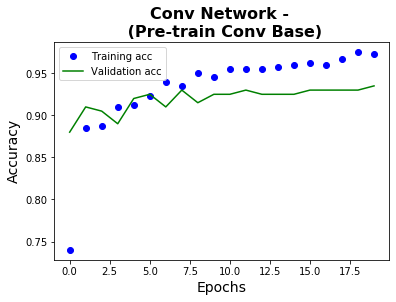

In [365]:
acc4 = history4.history['acc']
val_acc4 = history4.history['val_acc']
epochs4 = range(len(acc4))

plt.plot(epochs4, acc4, 'bo', label='Training acc')
plt.plot(epochs4, val_acc4, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network - \n (Pre-train Conv Base)', fontsize = 16, fontweight = 'bold')
plt.legend()

In [ ]:
#Re-train model 4 using all training data
model4.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),#default is 0.001 1e-3
              metrics=['acc'])

model4.fit(train_features2, train_labels2,
                    epochs=20,
                    batch_size=20)

In [ ]:
#Test accuracy - 95%
model4.evaluate(test_features, test_labels) 

In [ ]:
#Error analysis
pred4 = model4.predict(test_features)
pred4 = ((pred4 > 0.5) *1).reshape(200,)
true4 = test_labels #Mountain = 0, Sea = 1

In [366]:
confusion_matrix(true4, pred4) #much better

array([[97,  3],
       [ 7, 93]], dtype=int64)

In [395]:
model4.save('model4.h5')

## 6. Pre-trainined Model (2) - Feature extraction with data argumentataion

In [ ]:
model5 = models.Sequential()
model5.add(conv_base)
model5.add(layers.Flatten())
model5.add(layers.Dense(512, activation='relu'))
model5.add(layers.Dense(256, activation='relu'))
model5.add(layers.Dense(1, activation='sigmoid'))

In [367]:
model5.summary() #19,041,089 paramters

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_38 (Flatten)         (None, 8192)              0         
_________________________________________________________________
dense_118 (Dense)            (None, 512)               4194816   
_________________________________________________________________
dense_119 (Dense)            (None, 256)               131328    
_________________________________________________________________
dense_120 (Dense)            (None, 1)                 257       
Total params: 19,041,089
Trainable params: 4,326,401
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
print('This is the number of trainable weights '
      'before freezing the conv base:', len(model5.trainable_weights))

In [ ]:
conv_base.trainable = False #Freeze the convolutional base

In [369]:
print('This is the number of trainable weights '
      'after freezing the conv base:', len(model5.trainable_weights))

This is the number of trainable weights after freezing the conv base: 6


In [ ]:
train_datagen = ImageDataGenerator( ## Note that the validation data should not be augmented!
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

train_datagen2 = ImageDataGenerator( ## Note that the validation data should not be augmented!
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

train_generator2 = train_datagen2.flow_from_directory(
        train_dir2,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=10,
        class_mode='binary')

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=10,
        shuffle = False,
        class_mode='binary')

In [ ]:
model5.compile(optimizer=optimizers.RMSprop(lr=2e-6), #very small learning rate
              loss='binary_crossentropy',
              metrics=['acc'])

history5 = model5.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=100,
      validation_data=validation_generator,
      validation_steps=20) #200 training samples / 10 samples per batch = 20 steps per epoch

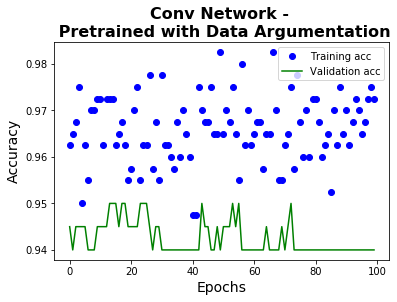

In [388]:
acc5 = history5.history['acc']
val_acc5 = history5.history['val_acc']
epochs5 = range(len(acc5))

plt.plot(epochs5, acc5, 'bo', label='Training acc')
plt.plot(epochs5, val_acc5, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network - \n Pretrained with Data Argumentation', fontsize = 16, fontweight = 'bold')
plt.legend()

In [383]:
def smooth_curve(points, factor=0.8):#Exponential Moving Average
    smoothed_points = []
    for point in points:
        if smoothed_points: #non-empty
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else: #if empty
            smoothed_points.append(point)
    return smoothed_points

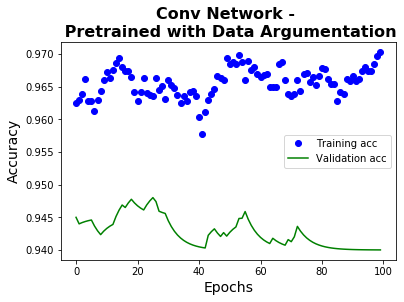

In [387]:
acc5 = history5.history['acc']
val_acc5 = history5.history['val_acc']
epochs5 = range(len(acc5))

plt.plot(epochs5, smooth_curve(acc5), 'bo', label='Training acc')
plt.plot(epochs5, smooth_curve(val_acc5), 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network - \n Pretrained with Data Argumentation', fontsize = 16, fontweight = 'bold')
plt.legend()

In [ ]:
#Re-train model 5 using all training data
model5.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=2e-6),#default is 0.001 1e-3
              metrics=['acc'])

model5.fit_generator(
      train_generator2,
      steps_per_epoch=60, #600 training samples / 10 samples per batch = 60 steps per epoch
      epochs=20) 

In [ ]:
#Test accuracy - 95.5%
model5.evaluate_generator(test_generator, steps=20) #200 test samples / 10 samples per batch = 20 steps

In [391]:
#Error analysis
pred5 = model5.predict_generator(test_generator, steps=20)
pred5 = ((pred5 > 0.5) *1).reshape(200,)
true5 = test_generator.classes #Mountain = 0, Sea = 1

In [392]:
confusion_matrix(true5, pred5) #much better

array([[98,  2],
       [ 7, 93]], dtype=int64)

In [394]:
model5.save('model5.h5')

## 7. Pre-trainined Model (3) - Fine Tuning

In [397]:
conv_base.summary()#14,714,688 parameters

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

In [ ]:
model6 = model5 #fine tune model #5 

In [415]:
conv_base.trainable = True #only allow to tune the block5's 3 Conv Layers

set_trainable = False #dummy
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [416]:
len(model6.trainable_weights) #last 3 conv layers and 3 dense layers (6*2 = 12 sets of weights)

12

In [418]:
model6.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_38 (Flatten)         (None, 8192)              0         
_________________________________________________________________
dense_118 (Dense)            (None, 512)               4194816   
_________________________________________________________________
dense_119 (Dense)            (None, 256)               131328    
_________________________________________________________________
dense_120 (Dense)            (None, 1)                 257       
Total params: 19,041,089
Trainable params: 11,405,825
Non-trainable params: 7,635,264
_________________________________________________________________


In [ ]:
model6.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-6), #very slow learning rate
              metrics=['acc'])

history6 = model6.fit_generator(
      train_generator,
      steps_per_epoch=40, #400 training samples / 10 samples per batch = 40 steps per epoch
      epochs=100,
      validation_data=validation_generator,
      validation_steps=20) 

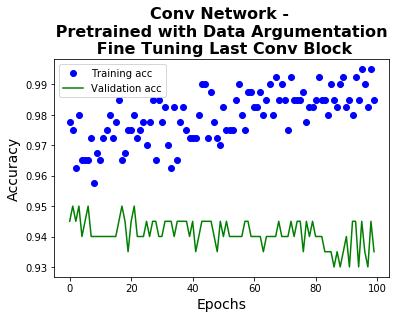

In [420]:
acc6 = history6.history['acc']
val_acc6 = history6.history['val_acc']
epochs6 = range(len(acc6))

plt.plot(epochs6, acc6, 'bo', label='Training acc')
plt.plot(epochs6, val_acc6, 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network - \n Pretrained with Data Argumentation \n Fine Tuning Last Conv Block', 
          fontsize = 16, fontweight = 'bold')
plt.legend()

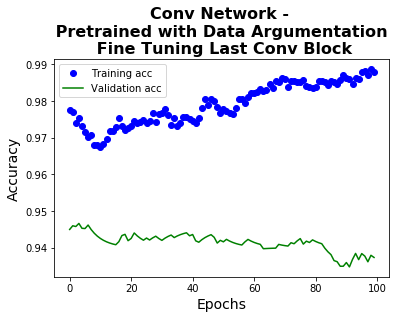

In [421]:
acc6 = history6.history['acc']
val_acc6 = history6.history['val_acc']
epochs6 = range(len(acc6))

plt.plot(epochs6, smooth_curve(acc6), 'bo', label='Training acc')
plt.plot(epochs6, smooth_curve(val_acc6), 'g-', label='Validation acc')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.title('Conv Network - \n Pretrained with Data Argumentation \n Fine Tuning Last Conv Block', 
          fontsize = 16, fontweight = 'bold')
plt.legend()

In [ ]:
#Re-train model 5 using all training data
model6.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-6),#default is 0.001 1e-3
              metrics=['acc'])

model6.fit_generator(
      train_generator2,
      steps_per_epoch=60, #600 training samples / 10 samples per batch = 60 steps per epoch
      epochs=30) 

In [423]:
#Test accuracy - 96%
model6.evaluate_generator(test_generator, steps=20) #200 test samples / 10 samples per batch = 20 steps

[0.16685413093396165, 0.9599999934434891]

In [426]:
#Error analysis
pred6 = model6.predict_generator(test_generator, steps=20)
pred6 = ((pred6 > 0.5) *1).reshape(200,)
true6 = test_generator.classes #Mountain = 0, Sea = 1

In [427]:
confusion_matrix(true6, pred6) #much better

array([[99,  1],
       [ 7, 93]], dtype=int64)

In [429]:
model6.save('model6.h5')

## Appendix. Visualize & Interpret the ConvNets

In [58]:
model = load_model('model3.h5')

In [59]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
flatten_26 (Flatten)         (None, 36992)             0         
__________

### Visualizing intermediate activations

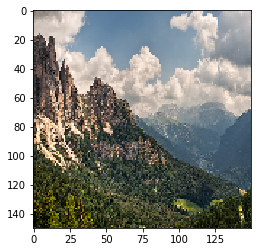

In [6]:
##A Mountain Image
fnames = [os.path.join(train_mountain_dir, fname) for fname in os.listdir(train_mountain_dir)]
img_path = fnames[40]
img = image.load_img(img_path, target_size=(150, 150)) #same shape as in the original model

img_tensor = image.img_to_array(img) #(250, 400, 3) 3D Tensor
img_tensor = np.expand_dims(img_tensor, axis=0) #(1, 250, 400, 3) 4D Tensor
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [8]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:6]] #only Conv Layers

#returns the values of the layer activations in the original model
activation_model = models.Model(inputs=model.input, outputs=layer_outputs) 

# one array per layer activation (in total 6 predicted arrays)
activations = activation_model.predict(img_tensor)

##activations[0].shape #148x148 feature map with 32 channels
##activations[1].shape #74x74 feature map with 32 channels

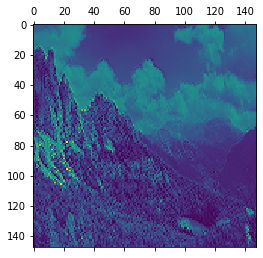

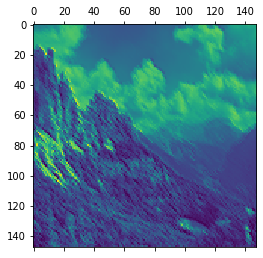

In [11]:
#Examples
#Display an array as a matrix using sequential colormaps
for i in range(2):
    plt.matshow(activations[0][0, :, :, i], cmap='viridis')  #First 2 channels of 1st layer
plt.show()

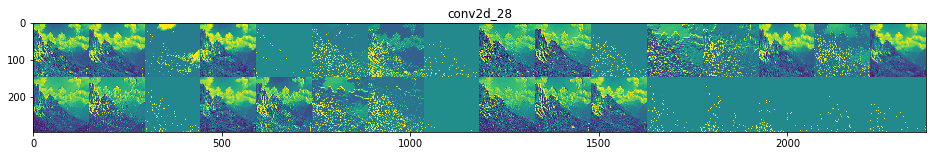

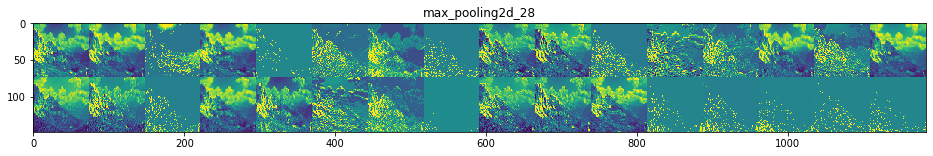

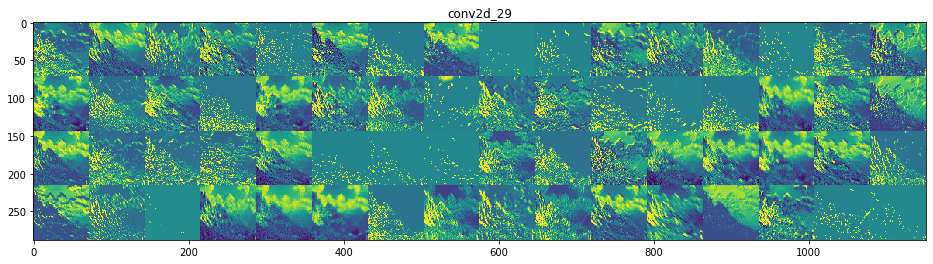

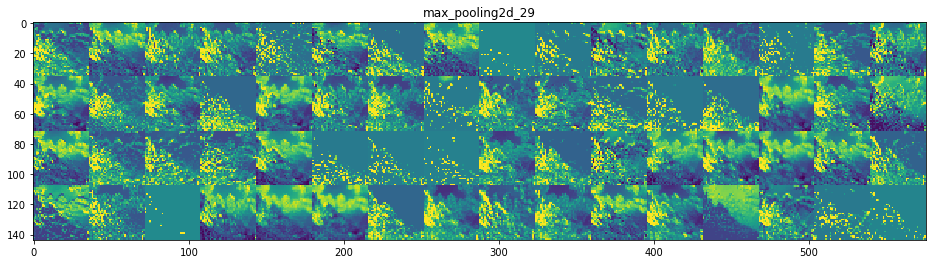

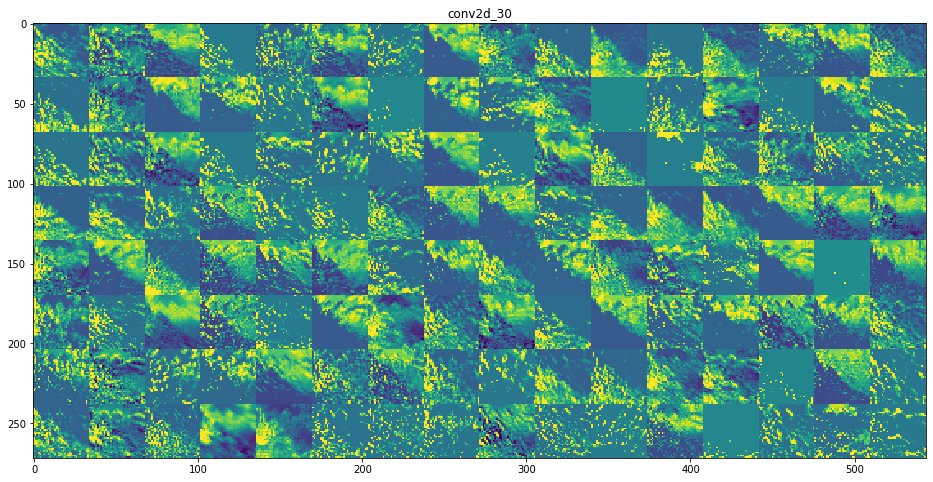

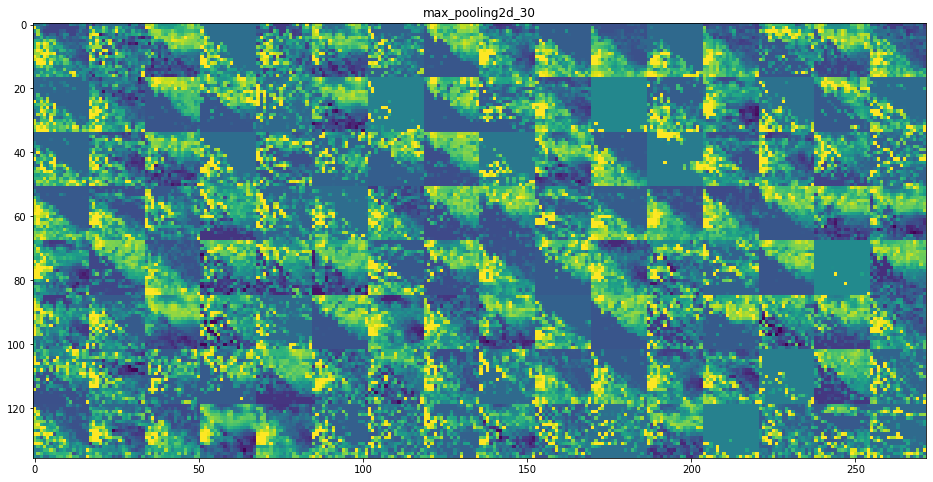

In [12]:
layer_names = []
for layer in model.layers[:6]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

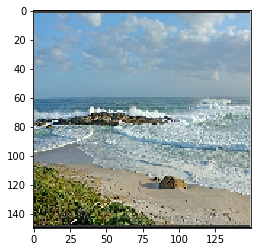

In [244]:
##A Sea Image
fnames = [os.path.join(train_sea_dir, fname) for fname in os.listdir(train_sea_dir)]
img_path = fnames[2]
img = image.load_img(img_path, target_size=(150, 150)) #same shape as in the original model

img_tensor = image.img_to_array(img) #(250, 400, 3) 3D Tensor
img_tensor = np.expand_dims(img_tensor, axis=0) #(1, 250, 400, 3) 4D Tensor
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [501]:
# one array per layer activation (in total 6 predicted arrays)
activations = activation_model.predict(img_tensor)

C:\Users\ERIC\Anaconda3\envs\tensorflow_cpu\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


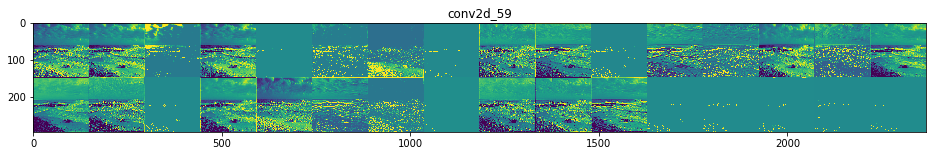

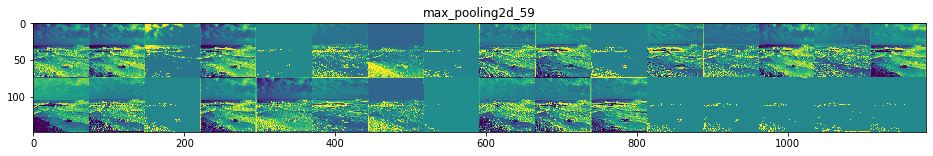

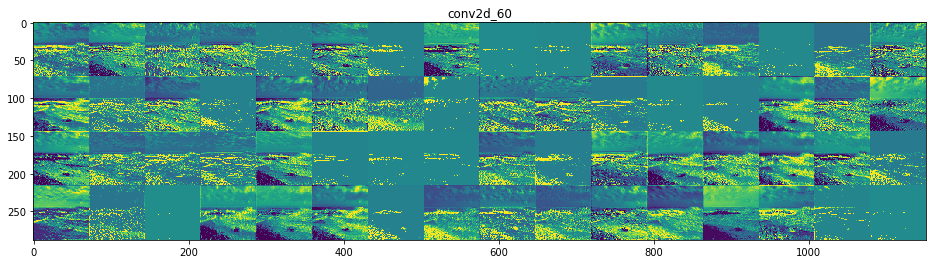

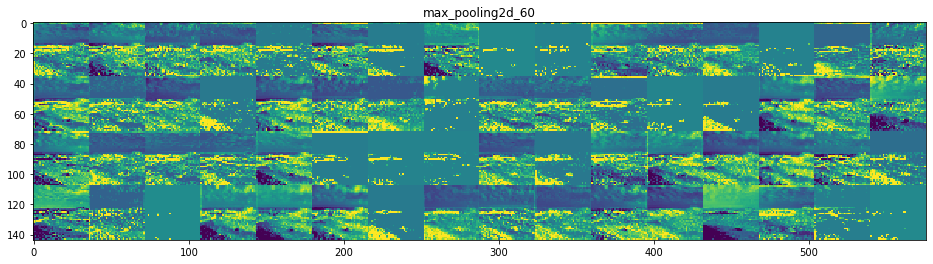

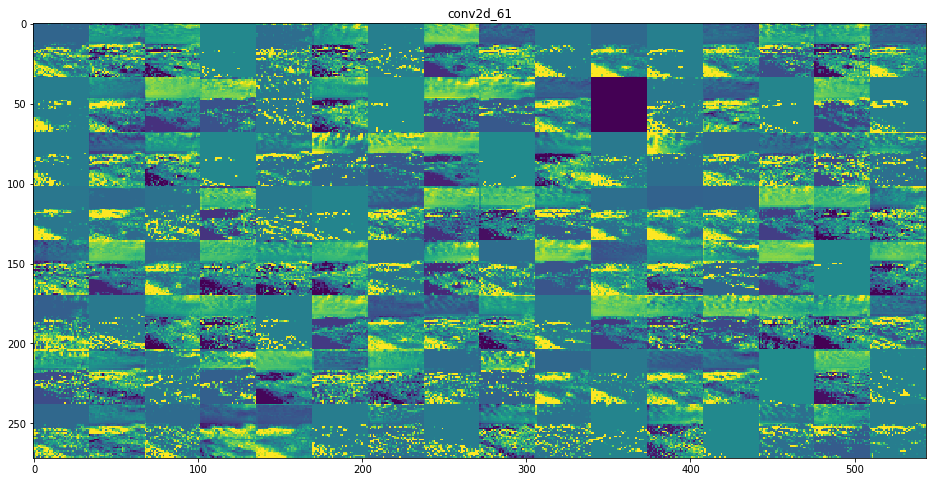

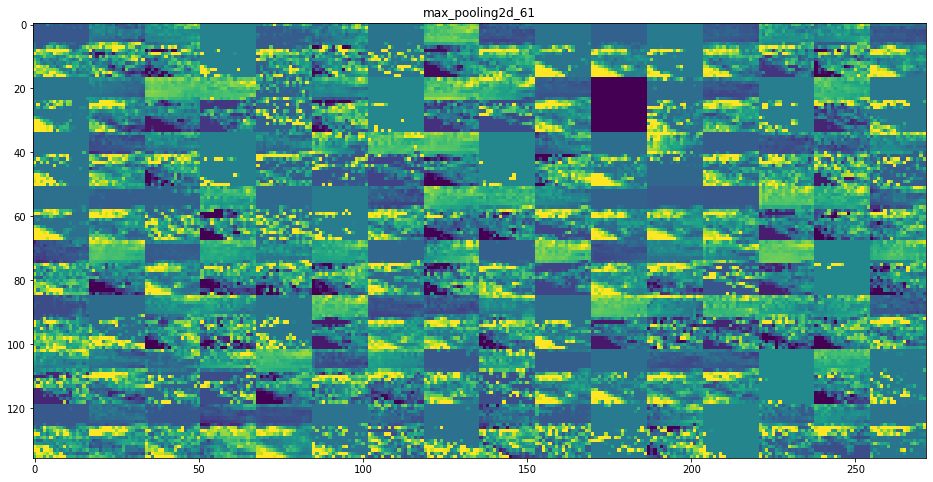

In [502]:
layer_names = []
for layer in model.layers[:6]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Visualizing convnet filters

In [13]:
from keras import backend as K

In [14]:
#turn it into a displayable image - integers within [0,255]
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [15]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

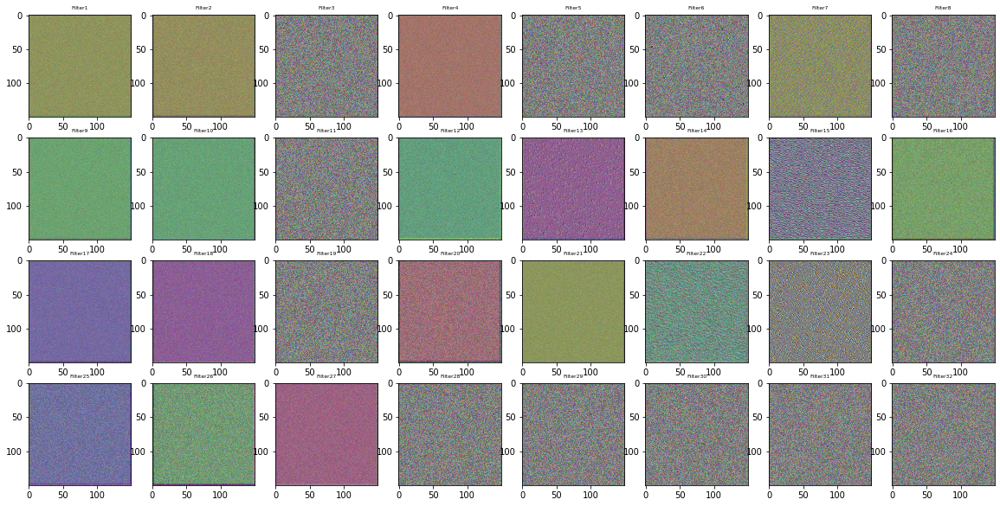

In [33]:
#Conv Layer 1
f = plt.figure(figsize=(20,10))
for i in range(32): 
    plt.subplot(4, 8, i+1)
    plt.imshow(generate_pattern('conv2d_28', i))
    plt.title('Filter' + str(i+1), fontsize = 6)

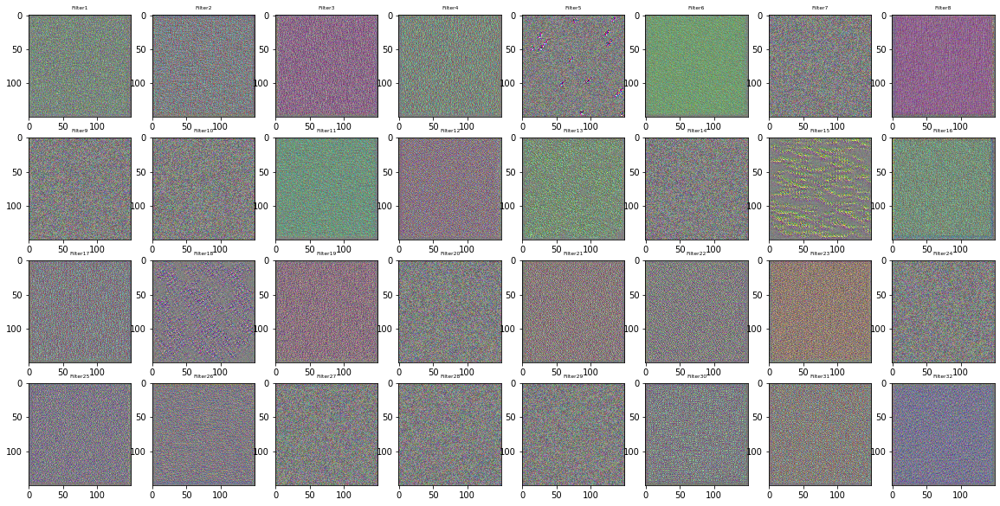

In [36]:
#Conv Layer 2
f = plt.figure(figsize=(20,10))
for i in range(32): 
    plt.subplot(4, 8, i+1)
    plt.imshow(generate_pattern('conv2d_29', i))
    plt.title('Filter' + str(i+1), fontsize = 6)

### Visualizing heatmaps of class activation

In [108]:
model2 = load_model('model3.h5')

In [132]:
model2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
flatten_26 (Flatten)         (None, 36992)             0         
__________

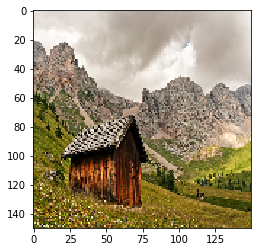

In [178]:
##A Mountain Image 1
img_path = 'D:\\MSc2\\Deep Learning Keras\\Task6\\train\\Mountain\\39.jpg'
img = image.load_img(img_path, target_size=(150, 150)) #same shape as in the original model

img_tensor = image.img_to_array(img) #(150, 150, 3) 3D Tensor
img_tensor = np.expand_dims(img_tensor, axis=0) #(1, 250, 400, 3) 4D Tensor
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [179]:
preds = model2.predict(img_tensor)
preds #prob of almomst 1 of class 0 (mountain)

array([[9.269094e-05]], dtype=float32)

In [180]:
mountain_output = model2.output[:,0]

# The is the output feature map of the last convolutional layer 
last_conv_layer = model2.get_layer('conv2d_30')

# This is the gradient of the Mountain class with regard to the output feature map of the layer
grads = K.gradients(mountain_output, last_conv_layer.output)[0]

# This is a vector of shape (128,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of the layer
# given a sample image
iterate = K.function([model2.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image 
pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the Mountain class
for i in range(32):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    # The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

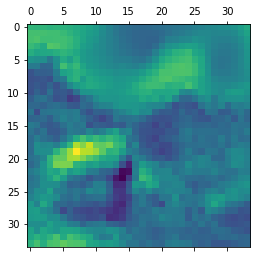

In [181]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [182]:
#use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('D:\MSc2\Deep Learning Keras\Task6\Visualization\Mountain_CAM1.jpg', superimposed_img)

True

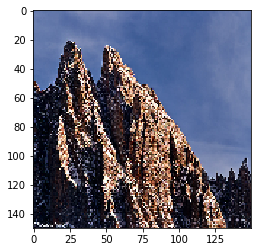

In [183]:
##A Mountain Image 2
img_path = 'D:\\MSc2\\Deep Learning Keras\\Task6\\train\\Mountain\\00000146 (3).jpg'
img = image.load_img(img_path, target_size=(150, 150)) #same shape as in the original model

img_tensor = image.img_to_array(img) #(150, 150, 3) 3D Tensor
img_tensor = np.expand_dims(img_tensor, axis=0) #(1, 250, 400, 3) 4D Tensor
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [185]:
preds = model2.predict(img_tensor)
preds #prob of 0.97 of class 0 (mountain)

array([[0.02799067]], dtype=float32)

In [186]:
mountain_output = model2.output[:,0]

# The is the output feature map of the last convolutional layer 
last_conv_layer = model2.get_layer('conv2d_30')

# This is the gradient of the Mountain class with regard to the output feature map of the layer
grads = K.gradients(mountain_output, last_conv_layer.output)[0]

# This is a vector of shape (128,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of the layer
# given a sample image
iterate = K.function([model2.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image 
pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the Mountain class
for i in range(32):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    # The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

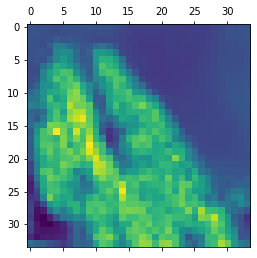

In [187]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [188]:
#use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('D:\MSc2\Deep Learning Keras\Task6\Visualization\Mountain_CAM2.jpg', superimposed_img)

True

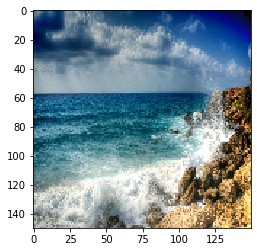

In [214]:
##A Sea Image 1
img_path = 'D:\\MSc2\\Deep Learning Keras\\Task6\\train\\Sea\\36.jpg'
img = image.load_img(img_path, target_size=(150, 150)) #same shape as in the original model

img_tensor = image.img_to_array(img) #(150, 150, 3) 3D Tensor
img_tensor = np.expand_dims(img_tensor, axis=0) #(1, 250, 400, 3) 4D Tensor
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [215]:
preds = model2.predict(img_tensor)
preds #prob of 0.96of class 1 (sea)

array([[0.9594259]], dtype=float32)

In [216]:
mountain_output = model2.output[:,0]

# The is the output feature map of the last convolutional layer 
last_conv_layer = model2.get_layer('conv2d_30')

# This is the gradient of the Mountain class with regard to the output feature map of the layer
grads = K.gradients(mountain_output, last_conv_layer.output)[0]

# This is a vector of shape (128,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of the layer
# given a sample image
iterate = K.function([model2.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image 
pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the Mountain class
for i in range(32):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    # The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

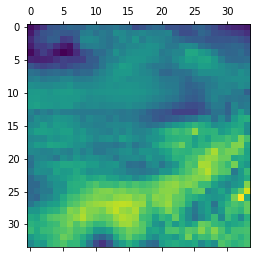

In [217]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [218]:
#use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('D:\MSc2\Deep Learning Keras\Task6\Visualization\Sea_CAM1.jpg', superimposed_img)

True

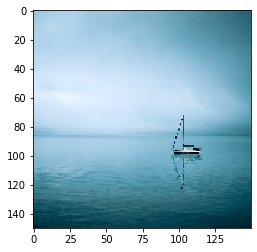

In [219]:
##A Sea Image 2
img_path = 'D:\\MSc2\\Deep Learning Keras\\Task6\\train\\Sea\\67.jpg'
img = image.load_img(img_path, target_size=(150, 150)) #same shape as in the original model

img_tensor = image.img_to_array(img) #(150, 150, 3) 3D Tensor
img_tensor = np.expand_dims(img_tensor, axis=0) #(1, 250, 400, 3) 4D Tensor
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [220]:
preds = model2.predict(img_tensor)
preds #prob of 0.97 of class 1 (sea)

array([[0.96831495]], dtype=float32)

In [221]:
mountain_output = model2.output[:,0]

# The is the output feature map of the last convolutional layer 
last_conv_layer = model2.get_layer('conv2d_30')

# This is the gradient of the Mountain class with regard to the output feature map of the layer
grads = K.gradients(mountain_output, last_conv_layer.output)[0]

# This is a vector of shape (128,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of the layer
# given a sample image
iterate = K.function([model2.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image 
pooled_grads_value, conv_layer_output_value = iterate([img_tensor])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the Mountain class
for i in range(32):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    # The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

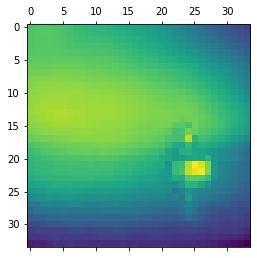

In [222]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [223]:
#use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('D:\MSc2\Deep Learning Keras\Task6\Visualization\Sea_CAM2.jpg', superimposed_img)

True